# This work is licensed under a Creative Commons BY 4.0 license https://creativecommons.org/licenses/by/4.0/
Copyright (c) 2023-2024, D. Kuiri, M. P. Nowak

THIS SOFTWARE IS PROVIDED BY THE COPYRIGHT HOLDERS AND CONTRIBUTORS "AS IS" AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE COPYRIGHT HOLDER OR CONTRIBUTORS BE LIABLE FOR ANY DIRECT, INDIRECT, INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

In [1]:
import ipyparallel as ipp

cluster = ipp.Client()

v = cluster[:]
lview = cluster.load_balanced_view()
len(v)

40

In [2]:
%%px --local

import os

os.environ["OMP_NUM_THREADS"] = "1" # export OMP_NUM_THREADS=1
os.environ["OPENBLAS_NUM_THREADS"] = "1" # export OPENBLAS_NUM_THREADS=1 
os.environ["MKL_NUM_THREADS"] = "1" # export MKL_NUM_THREADS=1                              #Block multithreading
os.environ["VECLIB_MAXIMUM_THREADS"] = "1" # export VECLIB_MAXIMUM_THREADS=1
os.environ["NUMEXPR_NUM_THREADS"] = "1" # export NUMEXPR_NUM_THREADS=1

In [3]:
%%px --local

import tinyarray
import kwant
import numpy as np
from matplotlib import pyplot as plt
import warnings
import scipy.constants as sc
import scipy.sparse.linalg as sla
from kwant.digest import uniform

In [4]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from adaptive import notebook_extension, Runner, Learner1D, Learner2D   #for adaptive plot
import adaptive
import pickle


notebook_extension()

In [5]:
def coherence_length(miu=5*1e-3, delta = 0.2*1e-3):
    m = sc.m_e*0.014
    factor = (sc.hbar)*np.sqrt(2/m)
    ret = (factor*np.sqrt(miu*sc.eV))/(delta*sc.eV)
    
    return ret*1e9

In [6]:
coherence_length(miu=5*1e-3, delta = 0.2*1e-3)

1166.4938485164575

## Long straight junction but with SC leads to top and bottom

In [7]:
%%px --local

sigma_0 = np.identity(2)
sigma_x = np.array([[0, 1], [1, 0]])
sigma_y = np.array([[0, -1j], [1j, 0]])
sigma_z = np.array([[1, 0], [0, -1]])
sigma_1 = np.array([[0, 1], [0, 0]])
sigma_2 = np.array([[0, 0], [1, 0]])

def make_system(L_N = 80, L_SC = 400, W = 2000, W_SC = 400):  
    a = 10e-9
    m = sc.m_e*0.014
    m2 = m*1000
    t = (sc.hbar**2/(2*m*a**2))/sc.eV
    tm = (sc.hbar**2/(2*m2*a**2))/sc.eV
    g = -50
    miu_B = ((sc.e*sc.hbar)/(2*sc.m_e))/sc.eV
    
    def onsite(site, B, phi, phi_2, Delta, mu, alpha):         
        (x,y) = site.pos
        
        if (x < -L_N/2):
            delta = Delta
            return (2*t + 2*tm - mu)*np.kron(sigma_0,sigma_z) + delta*np.kron(sigma_0,sigma_x)
        
        elif (x > L_N/2):
            delta = Delta
            return (2*t + 2*tm - mu)*np.kron(sigma_0,sigma_z) + delta*np.exp(1j*phi)*np.kron(sigma_0,sigma_1) \
                    + delta*np.exp(-1j*phi)*np.kron(sigma_0,sigma_2)
        
        elif (y > W/2):
            delta = Delta
            return (4*t - mu)*np.kron(sigma_0,sigma_z) + delta*np.exp(1j*phi_2)*np.kron(sigma_0,sigma_1) \
                    + delta*np.exp(-1j*phi_2)*np.kron(sigma_0,sigma_2)           
        
        elif (y < -W/2):
            delta = Delta
            return (4*t - mu)*np.kron(sigma_0,sigma_z) + delta*np.exp(-1j*phi_2)*np.kron(sigma_0,sigma_1) \
                    + delta*np.exp(1j*phi_2)*np.kron(sigma_0,sigma_2)   
        
        else:
            delta = 0
            return (4*t - mu)*np.kron(sigma_0,sigma_z) + (g/2)*miu_B*B*np.kron(sigma_y,sigma_0) 
        
    
    def hoppingx(site1, site2, alpha):
        (x1,y1 ) = site1.pos
        (x2,y2) = site2.pos
        x = (x1+x2)/2
        y = (y1+y2)/2
        
        if (x <= L_N/2 and x >= -L_N/2 and  -W/2 <= y and y<= W/2): 
            return -t*np.kron(sigma_0,sigma_z) - alpha*(1j/(2*a*1e9))*np.kron(sigma_y,sigma_z)
        else:
            return -t*np.kron(sigma_0,sigma_z)  
        
                
    def hoppingy(site1, site2, alpha): 
        (x1, y1) = site1.pos
        (x2, y2) = site2.pos
        
        x = (x1+x2)/2
        y = (y1+y2)/2
        
        if (x <= L_N/2 and x >= -L_N/2 and -W/2 <= y and y<= W/2): 
            return -t*np.kron(sigma_0,sigma_z)  + alpha*(1j/(2*a*1e9))*np.kron(sigma_x,sigma_z)
        elif (x > L_N/2 or x < -L_N/2):
            return -tm*np.kron(sigma_0,sigma_z)
        else:
            return -t*np.kron(sigma_0,sigma_z)
    
    def wire(pos):
        (x,y) = pos
        ret = False
        
        if (-L_SC - L_N/2 <= x <= L_N/2 + L_SC and -W/2 <= y <=W/2):
            ret = True
            
        if (-L_N/2 <= x <= L_N/2 and W/2 < y < W/2 + W_SC):
            ret = True
            
        if (-L_N/2 <= x <= L_N/2 and -W/2 - W_SC < y < -W/2):
            ret = True
        
        return ret
    
    lat = kwant.lattice.square(a*1e9, norbs = 4)
    syst = kwant.Builder()
    syst[lat.shape(wire, (0,0))] = onsite
    syst[kwant.builder.HoppingKind((1, 0), lat, lat)] = hoppingx
    syst[kwant.builder.HoppingKind((0, 1), lat, lat)] = hoppingy
    return syst

In [8]:
sys_finite = make_system(L_N = 500, L_SC = 2000, W = 2000, W_SC = 2000)
sysf_finite_with_SC_top_bottom = sys_finite.finalized()

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/kwant/plotter.py:144: ComplexWarning: Casting complex values to real discards the imaginary part
  color = np.asarray(color, dtype=float)


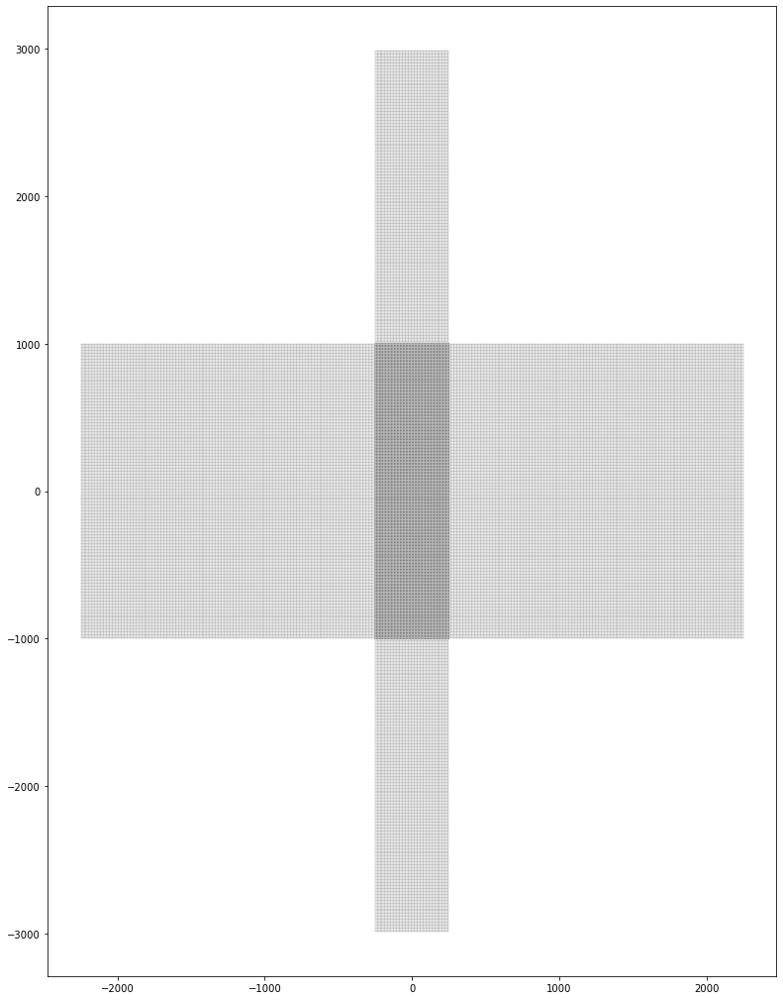

In [9]:
kwant.plotter.plot(sysf_finite_with_SC_top_bottom, fig_size = (18,18), colorbar = False,\
        site_color=lambda site: sysf_finite_with_SC_top_bottom.hamiltonian(site, site, params = dict(B = 1, alpha = 50*1e-3,\
                                                                           mu=5*1e-3, Delta = 0.2*1e-3,phi = 0, phi_2 = 0))[0,1]);

In [10]:
%%px --local

def energy(L_N, L_SC, W_SC, W, mu, Delta, alpha, B, phi, phi_2, n_values, return_eigenvectors = False):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite = make_system(L_N = L_N, L_SC = L_SC, W = W, W_SC = W_SC)
    sysf_finite_with_SC_top_bottom = sys_finite.finalized()
    ham_mat = sysf_finite_with_SC_top_bottom.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta,alpha = alpha, B = B, \
                                                                           phi = phi, phi_2 = phi_2), sparse=True)
    ev, evecs = sla.eigs(ham_mat, k=n_eigs, sigma=sigma, ncv=n_vec_lanczos,\
                  return_eigenvectors=True)

    ev_sorting_indices = ev.argsort()
    

    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    
    
    if (return_eigenvectors):
        return ev, evecs, sysf_finite_with_SC_top_bottom
    else:
        return ev

# Short junction, small topo region

In [ ]:
phi_values_new = np.linspace(0, 2*np.pi, 100)
res = lview.map_async(lambda phi: energy(L_N = 100, L_SC = 2000, W_SC = 0, W = 2000, mu = 5*1e-3, \
                                                    Delta = 0.2*1e-3, alpha = 0.05, B = 0.2, \
                                                    phi = phi, phi_2 = 0*np.pi, n_values = 200, return_eigenvectors = False), phi_values_new)
res.wait_interactive()
energies_short_junction = res.get()

In [11]:
phi_values_new = np.linspace(0, 2*np.pi, 100)

In [12]:
with open('energies_short_junction.pkl', 'rb') as energies_without_SC_top_L_N_100_pickle:    
    Pickle_energies_without_SC_top_L_N_100 = pickle.load(energies_without_SC_top_L_N_100_pickle)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


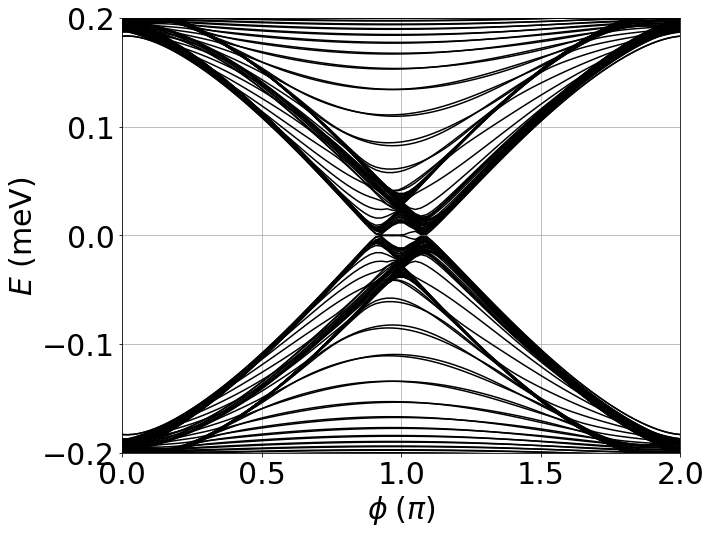

In [17]:
plt.figure(figsize = (10,8))
plt.plot(phi_values_new/np.pi, np.array(Pickle_energies_without_SC_top_L_N_100)*1e3, "k")
plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.xlim(0,2)
plt.ylim(-0.2,0.2)
plt.yticks([-0.2, -0.1, 0, 0.1, 0.2])
plt.tick_params(labelsize=30)
plt.grid()
#plt.savefig("L_N_100_without_sc.pdf")
plt.show()

# For long junction

##  $L_j = 500$ nm 

In [ ]:
phi_values_new = np.linspace(0, 2*np.pi, 100)
res_W_SC_0 = lview.map_async(lambda phi: energy(L_N = 500, L_SC = 2000,  W = 2000, W_SC = 0, mu=5*1e-3, \
                                                    Delta = 0.2*1e-3, alpha = 0.05, B = 0.2, \
                                                    phi = phi, phi_2 = 0*np.pi, n_values = 200, return_eigenvectors = False), \
                                         phi_values_new)
res_W_SC_0.wait_interactive()
energies_W_SC_0 = res_W_SC_0.get()

In [18]:
with open('energies_W_SC_0.pkl', 'rb') as energies_W_SC_0_pickle:    
    Pickle_energies_W_SC_0 = pickle.load(energies_W_SC_0_pickle)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


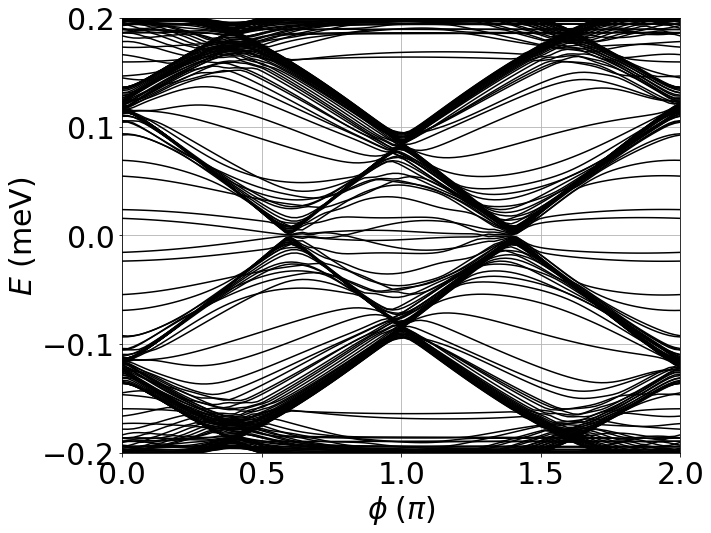

In [19]:
plt.figure(figsize = (10,8))
plt.plot(phi_values_new/np.pi, np.array(Pickle_energies_W_SC_0)*1e3, "k")
plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.xlim(0,2)
plt.ylim(-0.2,0.2)
plt.yticks([-0.2, -0.1, 0, 0.1, 0.2])
plt.tick_params(labelsize=30)
plt.grid()
#plt.savefig("L_N_500_without_sc.pdf")
plt.show()

# After attaching two SC segments at top and bottom

In [ ]:
phi_values_new = np.linspace(0, 2*np.pi, 100)
res_with_top_SC = lview.map_async(lambda phi: energy(L_N = 500, L_SC = 2000, W = 2000, W_SC = 2000, mu = 5*1e-3, \
                                                    Delta = 0.2*1e-3, alpha = 0.05, B = 0.2, \
                                                    phi = phi, phi_2 = 0*np.pi, n_values = 200, return_eigenvectors = False), phi_values_new)
res_with_top_SC.wait_interactive()
energies_with_top_SC_n_200 = res_with_top_SC.get()

In [20]:
with open('energies_with_top_SC_n_200.pkl', 'rb') as energies_with_top_SC_n_200_pickle:    
    Pickle_energies_with_top_SC_n_200 = pickle.load(energies_with_top_SC_n_200_pickle)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


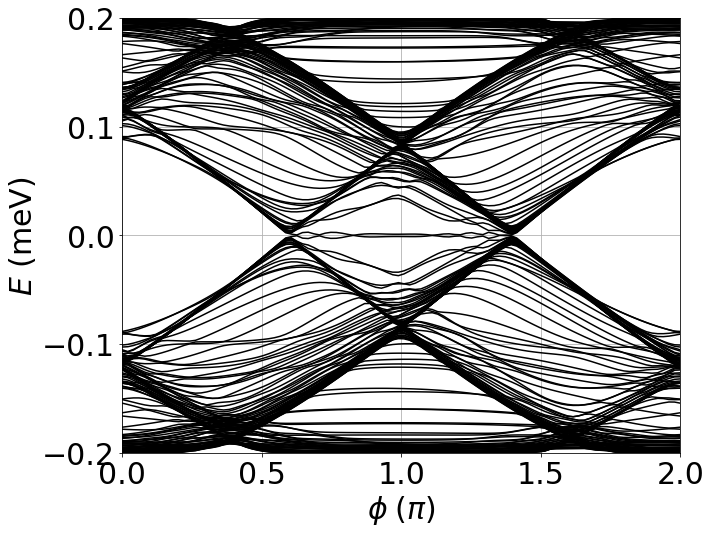

In [21]:
plt.figure(figsize = (10,8))
plt.plot(phi_values_new/np.pi, np.array(Pickle_energies_with_top_SC_n_200)*1e3, "k")
plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.xlim(0,2)
plt.ylim(-0.2,0.2)
plt.yticks([-0.2, -0.1, 0, 0.1, 0.2])
plt.tick_params(labelsize=30)
plt.grid()
#plt.savefig("L_N_500_with_sc.pdf")
plt.show()

## For $L_j = 1000$ nm

In [ ]:
phi_values_new = np.linspace(0, 2*np.pi, 100)
res_W_SC_2000_L_N_1000 = lview.map_async(lambda phi: energy(L_N = 1000, L_SC = 2000,  W = 2000, W_SC = 2000, mu=5*1e-3, \
                                                    Delta = 0.2*1e-3, alpha = 0.05, B = 0.2, \
                                                    phi = phi, phi_2 = 0*np.pi, n_values = 200, return_eigenvectors = False), \
                                         phi_values_new)
res_W_SC_2000_L_N_1000.wait_interactive()
energies_W_SC_2000_L_N_1000 = res_W_SC_2000_L_N_1000.get()

In [22]:
with open('energies_W_SC_2000_L_N_1000.pkl', 'rb') as energies_W_SC_2000_L_N_1000_pickle:    
    Pickle_energies_W_SC_2000_L_N_1000 = pickle.load(energies_W_SC_2000_L_N_1000_pickle)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


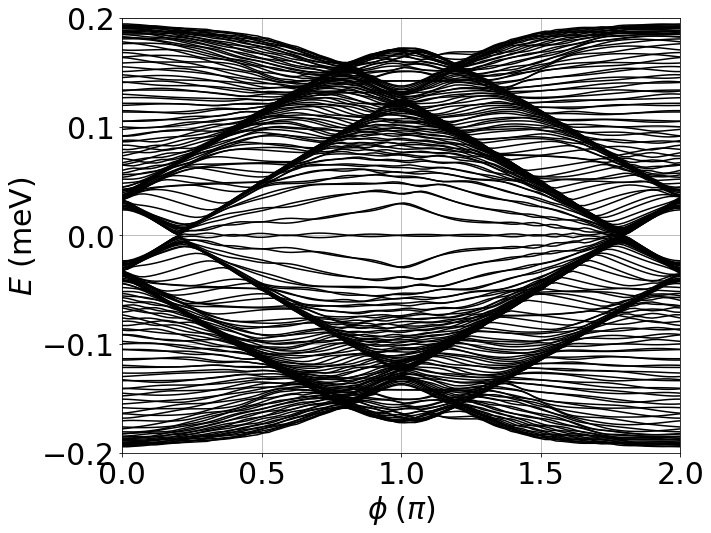

In [23]:
plt.figure(figsize = (10,8))
plt.plot(phi_values_new/np.pi, np.array(Pickle_energies_W_SC_2000_L_N_1000)*1e3, "k")
plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
plt.ylabel("$E$ (meV)", fontsize=30)
plt.xlim(0,2)
plt.ylim(-0.2,0.2)
plt.yticks([-0.2, -0.1, 0, 0.1, 0.2])
plt.tick_params(labelsize=30)
plt.grid()
#plt.savefig("L_N_1000_with_sc.pdf")
plt.show()

# Calculating the probability density for $L_j = 500$ nm with extra two SC segments

index= 0 , Energy =  -0.044538075434383616


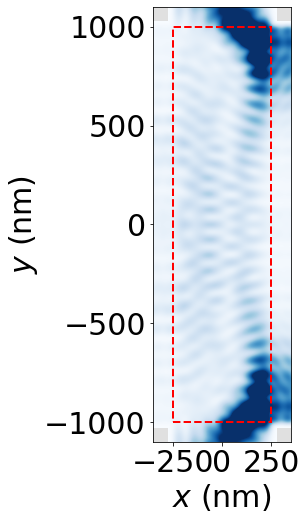

index= 1 , Energy =  -0.035463165905572455


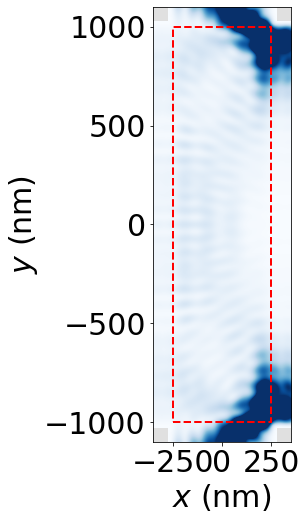

index= 2 , Energy =  -0.03264694887816528


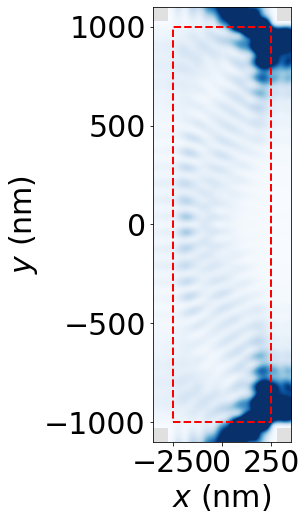

index= 3 , Energy =  -0.001101112639261516


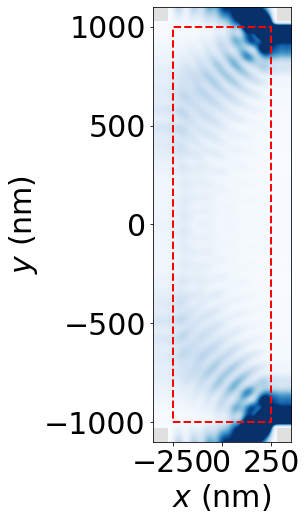

index= 4 , Energy =  0.0011011126392612147


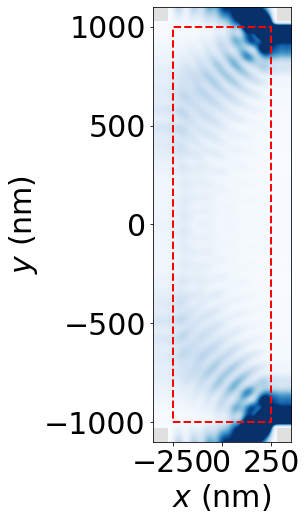

index= 5 , Energy =  0.0326469488781652


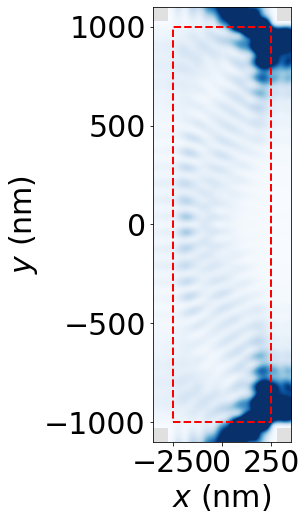

index= 6 , Energy =  0.035463165905572455


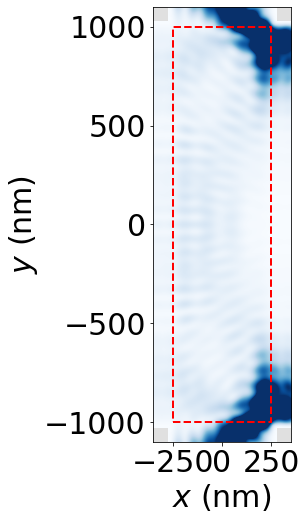

index= 7 , Energy =  0.04453807543438366


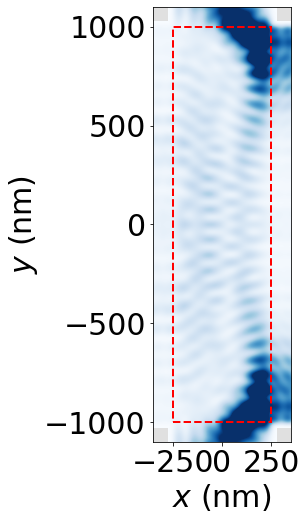

In [24]:
energies, vectors, system = energy(L_N = 500, L_SC = 2000, W_SC = 2000, W = 2000, mu = 5*1e-3, \
                                                    Delta = 0.2*1e-3, alpha = 0.05, B = 0.2, \
                                                    phi = 1.01*np.pi, phi_2 = 0.*np.pi, n_values = 8, \
                                                    return_eigenvectors = True)
e_up_matrix = np.array([[1, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]])
h_do_matrix = np.array([[0, 0, 0, 0], [0, 1, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]])
e_do_matrix = np.array([[0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 1, 0], [0, 0, 0, 0]])
h_up_matrix = np.array([[0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 1]])

Q_e_up = kwant.operator.Density(system, e_up_matrix)
Q_h_do = kwant.operator.Density(system, h_do_matrix)
Q_e_do = kwant.operator.Density(system, e_do_matrix)
Q_h_up = kwant.operator.Density(system, h_up_matrix)

for ie, e in enumerate(np.array(energies)):
    print("index=", ie, ", Energy = ", np.real(e) * 1e3)
    p = vectors[:, ie]
    Density_e_up = Q_e_up(p)
    Density_h_do = Q_h_do(p)
    Density_e_do = Q_e_do(p)
    Density_h_up = Q_h_up(p)
    
    fig, ax = plt.subplots(figsize=(10, 8))
    cbar = kwant.plotter.density(system, Density_e_up + Density_e_do + Density_h_do + Density_h_up,
                                 vmax=3*1e-5, fig_size=(10, 8), relwidth=0.01, colorbar=True, show=False, ax=ax, cmap='Blues')
    
    ax.set_ylabel("$y$ (nm)", fontsize=30)
    ax.set_xlabel("$x$ (nm)", fontsize=30)
    ax.set_xlim(-350, 350)
    ax.set_ylim(-1100, 1100)
    ax.tick_params(labelsize=30)
    
    rect = plt.Rectangle((-250, -1000), 500, 2000, linewidth=2, edgecolor='r', facecolor='none', linestyle='--')
    ax.add_patch(rect)
    
    #plt.savefig('electron_hole_density_cut_with_rec' + str(ie + 1) + '.pdf', dpi=500)
    plt.show()


In [25]:
%%px --local

def energy_positive(L_N, L_SC, W_SC, W, mu, Delta, alpha, B, phi, phi_2, n_values, return_eigenvectors = False):
    class LuInv(sla.LinearOperator):
        def __init__(self, A):
            inst = kwant.linalg.mumps.MUMPSContext()
            inst.factor(A, ordering='metis')
            self.solve = inst.solve
            try:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype,
                                            matvec=self._matvec)
            except TypeError:
                super(LuInv, self).__init__(shape=A.shape, dtype=A.dtype)

        def _matvec(self, x):
            return self.solve(x.astype(self.dtype))

    n_eigs = n_values
    n_vec_lanczos = 3*n_values+10
    sigma=0.0
    
    sys_finite_aniso_1000, sys_infinite_aniso_1000 = make_system_aniso_1000(L_N = L_N, L_SC = L_SC, W=W, W_SC = W_SC)
    sysf_aniso_1000 = sys_finite_aniso_1000.finalized()
    ham_mat_aniso_1000 = sysf_aniso_1000.hamiltonian_submatrix(params=dict(mu = mu, Delta = Delta,alpha = alpha, B = B, \
                                                                           phi = phi, phi_2 = phi_2), sparse=True)
    ev, evecs = sla.eigs(ham_mat_aniso_1000, k=n_eigs, OPinv=LuInv(ham_mat_aniso_1000), sigma=sigma, ncv=n_vec_lanczos,\
                  return_eigenvectors=True)

    ev_sorting_indices = ev.argsort()
    

    ev = ev[ev_sorting_indices]
    evecs = np.array(evecs)[:,ev_sorting_indices]
    
    positive_indices = np.where(ev > 0)[0]
    
    if (return_eigenvectors):
        return ev[positive_indices], evecs[:,positive_indices]
    else:
        return ev[positive_indices]

## Calculating the critical current $I_c = max(I)$ where $I = -\frac{e}{\hbar} \frac{\partial E}{\partial \phi}$

In [26]:
def critical_current(B_values, L_N=100, L_SC=2000, W=2000, W_SC=2000, mu=5e-3, Delta=0.2e-3, alpha=0.05):
    spectrum = [] 
    E_junction = []
    I_c_values = []
    phi_values_max = []  # To store the phase corresponding to the maximum current
    phi_values_E_j_max = [] # To store the phase corresponding to ground state
    for B in B_values:
        phi_values_new = np.linspace(0, 2*np.pi, 100)
        res_with_top_SC = lview.map_async(lambda phi: energy_positive(L_N=L_N, L_SC=L_SC, W=W, W_SC=W_SC, mu=mu, \
                                                                    Delta=Delta, alpha=alpha, B=B, \
                                                                    phi=phi, phi_2=0*np.pi, n_values=100,
                                                                    return_eigenvectors=False), phi_values_new)
        res_with_top_SC.wait_interactive()
        energies_with_top_SC = res_with_top_SC.get()
        e = np.array(energies_with_top_SC) * sc.eV
        I_s = -(sc.e / sc.hbar) * np.sum(np.gradient(e[:, :], phi_values_new, axis=0), axis=1)
        E_j = - np.sum(energies_with_top_SC, axis = 1)
        I_c = np.max(I_s)
        
        spectrum.append(energies_with_top_SC)
        E_junction.append(E_j)
        I_c_values.append(I_c)
        phi_max = phi_values_new[np.argmax(I_s)]  #Find the phase corresponding to the maximum current
        phi_E_j_max = phi_values_new[np.argmin(E_j)] #Find the phase corresponding to ground state
        phi_values_max.append(phi_max)
        phi_values_E_j_max.append(phi_E_j_max)
        
    return spectrum, E_junction, I_c_values, phi_values_max, phi_values_E_j_max


In [ ]:
B_values = np.linspace(0, 5, 100)
spectrum_L_N_100, E_junction_L_N_100, I_c_values_L_N_100, phi_values_max_L_N_100, phi_values_E_j_max_L_N_100 = \
critical_current(B_values, L_N=100, L_SC=2000, W=2000, W_SC=2000, mu=5e-3, \
                                                              Delta=0.2e-3, alpha=0.05)

In [27]:
B_values = np.linspace(0, 5, 100)

In [28]:
with open('phi_values_E_j_max_L_N_100.pkl', 'rb') as phi_values_E_j_max_L_N_100_pickle:    
    Pickle_phi_values_E_j_max_L_N_100 = pickle.load(phi_values_E_j_max_L_N_100_pickle)

In [29]:
with open('phi_values_max_L_N_100.pkl', 'rb') as phi_values_max_L_N_100_pickle:    
    Pickle_phi_values_max_L_N_100 = pickle.load(phi_values_max_L_N_100_pickle)

In [30]:
with open('I_c_values_L_N_100.pkl', 'rb') as I_c_values_L_N_100_pickle:    
    Pickle_I_c_values_L_N_100 = pickle.load(I_c_values_L_N_100_pickle)

In [31]:
with open('E_junction_L_N_100.pkl', 'rb') as E_junction_L_N_100_pickle:    
    Pickle_E_junction_L_N_100 = pickle.load(E_junction_L_N_100_pickle)

In [32]:
phi_values_new = np.linspace(0, 2*np.pi, 100)

In [35]:
B_values = np.linspace(0, 5, 100)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


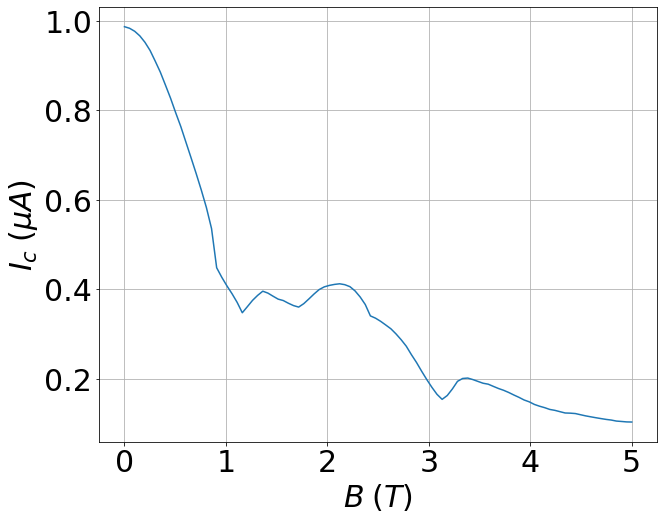

In [36]:
plt.figure(figsize = (10,8))
plt.plot(B_values, np.array(Pickle_I_c_values_L_N_100)*1e6)
#plt.title("At $B_{plane}$ = 1 T", fontsize = 30)
plt.xlabel("$B\;(T)$", fontsize=30)
plt.ylabel("$I_c\;(\mu A)$", fontsize=30)
plt.grid()
plt.tick_params(labelsize=30)
#plt.legend(fontsize = 30)

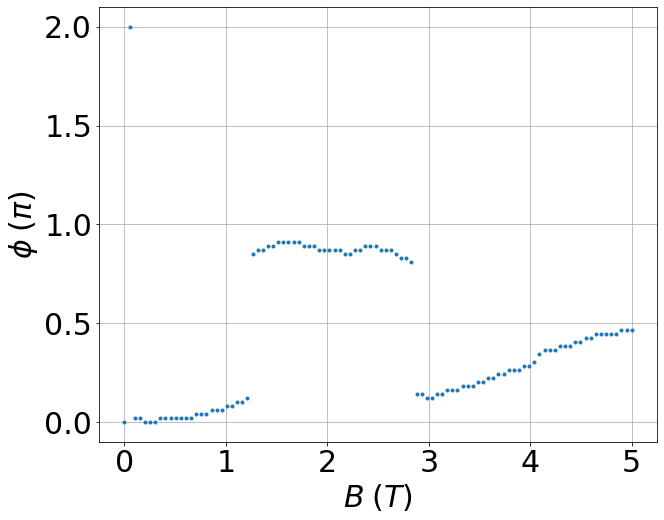

In [37]:
plt.figure(figsize = (10,8))
plt.plot(B_values, np.array(Pickle_phi_values_E_j_max_L_N_100)/np.pi, ".")
#plt.title("At $B_{plane}$ = 1 T", fontsize = 30)
plt.ylabel("$\phi\; (\pi)$", fontsize = 30)
plt.xlabel("$B\;(T)$", fontsize=30)
plt.grid()
plt.tick_params(labelsize=30)
#plt.legend(fontsize = 30)

In [38]:
data_L_100 = np.array(Pickle_phi_values_E_j_max_L_N_100)/np.pi

In [39]:
data_L_100[data_L_100 == 2] = 0

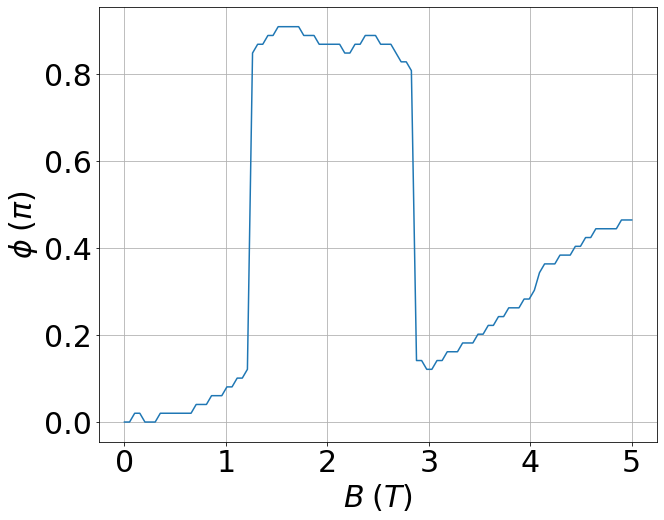

In [40]:
plt.figure(figsize = (10,8))
plt.plot(B_values, data_L_100)
#plt.title("At $B_{plane}$ = 1 T", fontsize = 30)
plt.ylabel("$\phi\; (\pi)$", fontsize = 30)
plt.xlabel("$B\;(T)$", fontsize=30)
plt.grid()
plt.tick_params(labelsize=30)
#plt.legend(fontsize = 30)

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


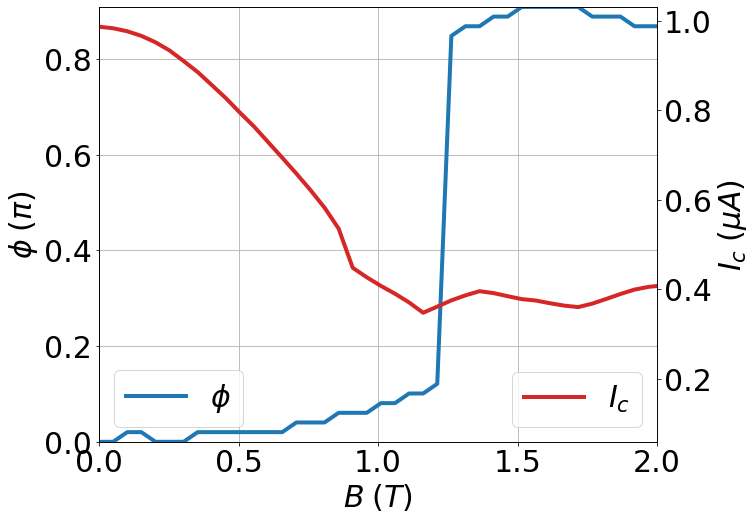

In [41]:
fig, ax1 = plt.subplots(figsize=(10, 8))

color = 'tab:blue'
ax1.set_xlabel('$B\;(T)$', fontsize = 30)
ax1.set_ylabel("$\phi\; (\pi)$", fontsize = 30)
ax1.plot(B_values, data_L_100, color=color, linewidth=4.0, linestyle='-',\
         label = "$\phi$")
ax1.tick_params(axis='y', labelsize=30)
ax1.tick_params(axis='x', labelsize=30)
ax1.set_xlim(0, 2)
ax1.set_ylim(0, np.max(data_L_100))
ax1.grid()


ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel("$I_c\;(\mu A$)", fontsize = 30)
ax2.plot(B_values, np.array(Pickle_I_c_values_L_N_100)*1e6, color=color, linewidth=4.0, \
         linestyle='-', label = "$I_c$")
ax2.tick_params(axis='y', labelsize=30)

ax1.legend(loc='lower left', fontsize=30)
ax2.legend(loc='lower right', fontsize=30)
#plt.savefig("ground_state_critical_current_B_L_100.pdf")
plt.show()

In [ ]:
B_values = np.linspace(0, 1, 100)
spectrum_L_N_500,E_junction_L_N_500,I_c_values_L_N_500,phi_values_max_L_N_500,phi_values_Ej_max_L_N_500 = critical_current(B_values, L_N=500, L_SC=2000,\
                                                                                         W=2000, W_SC=2000, mu=5e-3, \
                                                                                         Delta=0.2e-3, alpha=0.05)

In [42]:
with open('I_c_values_L_N_500.pkl', 'rb') as I_c_values_L_N_500_pickle:    
    Pickle_I_c_values_L_N_500 = pickle.load(I_c_values_L_N_500_pickle)

In [43]:
with open('phi_values_Ej_max_L_N_500.pkl', 'rb') as phi_values_Ej_max_L_N_500_pickle:    
    Pickle_phi_values_Ej_max_L_N_500 = pickle.load(phi_values_Ej_max_L_N_500_pickle)

In [44]:
B_values = np.linspace(0, 1, 100)


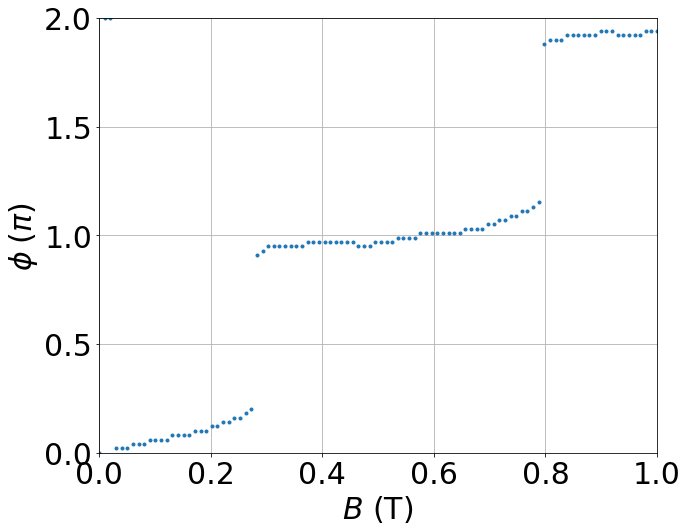

In [45]:
plt.figure(figsize = (10,8))
plt.plot(B_values, np.array(Pickle_phi_values_Ej_max_L_N_500)/np.pi, ".")
#plt.title("At $B_{plane}$ = 1 T", fontsize = 30)
plt.ylabel("$\phi\; (\pi)$", fontsize = 30)
plt.xlabel("$B$ (T)", fontsize=30)
plt.tick_params(labelsize=30)
plt.grid()
plt.xlim(0,np.amax(B_values))
plt.ylim(0,2)
#plt.savefig("ground_state_phi_B_L_N_500.pdf")
plt.show()
#plt.legend(fontsize = 30)          

In [46]:
data_L_500= np.array(Pickle_phi_values_Ej_max_L_N_500)/np.pi

In [47]:
data_L_500[data_L_500 == 2] = 0

In [48]:
B_values = np.linspace(0, 1, 100)

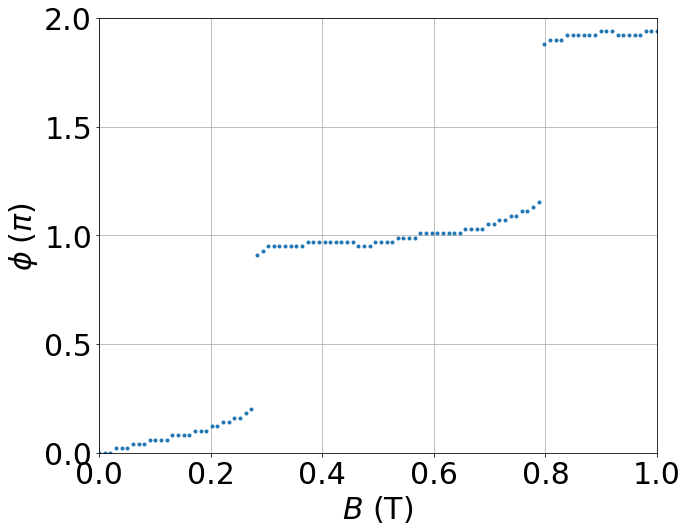

In [49]:
plt.figure(figsize = (10,8))
plt.plot(B_values, data_L_500, ".")
#plt.title("At $B_{plane}$ = 1 T", fontsize = 30)
plt.ylabel("$\phi\; (\pi)$", fontsize = 30)
plt.xlabel("$B$ (T)", fontsize=30)
plt.tick_params(labelsize=30)
plt.grid()
plt.xlim(0,np.amax(B_values))
plt.ylim(0,2)
#plt.savefig("ground_state_phi_B_L_N_500.pdf")
plt.show()
#plt.legend(fontsize = 30)   

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


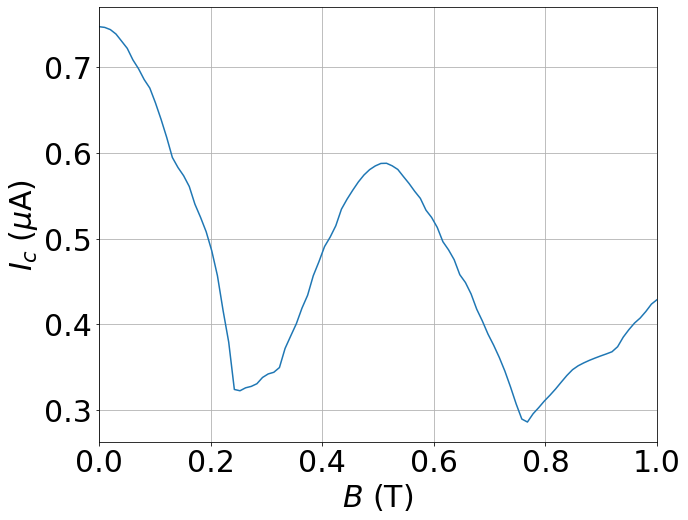

In [51]:
plt.figure(figsize = (10,8))
plt.plot(B_values, np.array(Pickle_I_c_values_L_N_500)*1e6)
#plt.title("At $B_{plane}$ = 1 T", fontsize = 30)
plt.xlabel("$B$ (T)", fontsize=30)
plt.ylabel("$I_c\;(\mu$A$)$", fontsize=30)
#$B_{\perp}\;(\mu$T$)$
plt.grid()
plt.tick_params(labelsize=30)
plt.xlim(0,np.amax(B_values))

#plt.savefig("critical_current_L_N_500.pdf")
plt.show()

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


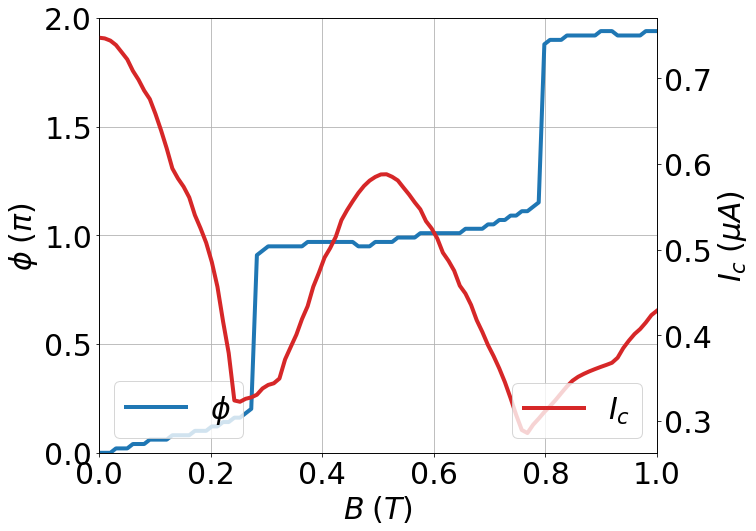

In [52]:
fig, ax1 = plt.subplots(figsize=(10, 8))

color = 'tab:blue'
ax1.set_xlabel('$B\;(T)$', fontsize = 30)
ax1.set_ylabel("$\phi\; (\pi)$", fontsize = 30)
ax1.plot(B_values, data_L_500, color=color, linewidth=4.0, linestyle='-',\
         label = "$\phi$")
ax1.tick_params(axis='y', labelsize=30)
ax1.tick_params(axis='x', labelsize=30)
ax1.set_xlim(0, np.amax(B_values))
ax1.set_ylim(0,2)
ax1.grid()


ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel("$I_c\;(\mu A$)", fontsize = 30)
ax2.plot(B_values, np.array(Pickle_I_c_values_L_N_500)*1e6, color=color, linewidth=4.0, \
         linestyle='-', label = "$I_c$")
ax2.tick_params(axis='y', labelsize=30)

ax1.legend(loc='lower left', fontsize=30)
ax2.legend(loc='lower right', fontsize=30)
#plt.savefig("ground_state_critical_current_B_L_500.pdf")
plt.show()

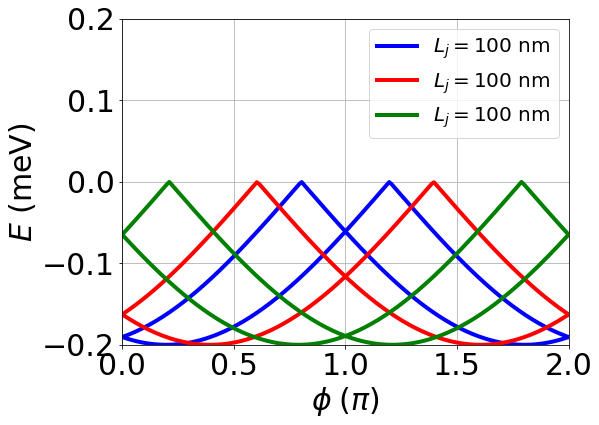

In [53]:
def En_analytical_spin(phi, L, B_plane, miu, Delta,spin, N):
    g = -50
    m = sc.m_e*0.014 
    def E_z(B_plane):
        miu_B_plane = (sc.e*sc.hbar)/(2*sc.m_e)
        return (g*miu_B_plane*B_plane)/2
    
    def Fermi_velo_term(miu):
        factor = sc.hbar*np.sqrt(2/m)
        return factor*np.sqrt(miu*sc.eV)
    
    phase_shift_spin = (phi/2) + spin*((E_z(B_plane)*L*1e-9)/Fermi_velo_term(miu))                                        
    return N*Delta*np.abs(np.cos(phase_shift_spin))

phi_values = np.linspace(0, 2*np.pi, 200)

ABS_for_up_spin_pos_L_100 = En_analytical_spin(phi = phi_values, L = 100, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, spin = 1, N =1)
ABS_for_do_spin_pos_L_100 = En_analytical_spin(phi = phi_values, L = 100, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, spin = -1, N = 1)
ABS_for_up_spin_pos_L_200 = En_analytical_spin(phi = phi_values, L = 200, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, spin = 1, N =1)
ABS_for_do_spin_pos_L_200 = En_analytical_spin(phi = phi_values, L = 200, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, spin = -1, N = 1)
ABS_for_up_spin_pos_L_400 = En_analytical_spin(phi = phi_values, L = 400, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, spin = 1, N =1)
ABS_for_do_spin_pos_L_400 = En_analytical_spin(phi = phi_values, L = 400, B_plane = 0.5, Delta = 0.2*1e-3, miu = 5*1e-3, spin = -1, N = 1)

plt.figure(figsize=(8,6))
plt.plot(phi_values/np.pi, -ABS_for_up_spin_pos_L_100*1e3, "b", linewidth=4, label = "$L_j = 100$ nm")
plt.plot(phi_values/np.pi, -ABS_for_do_spin_pos_L_100*1e3, "b", linewidth=4)
plt.plot(phi_values/np.pi, -ABS_for_up_spin_pos_L_200*1e3, "r", linewidth=4, label = "$L_j = 100$ nm")
plt.plot(phi_values/np.pi, -ABS_for_do_spin_pos_L_200*1e3, "r", linewidth=4)
plt.plot(phi_values/np.pi, -ABS_for_up_spin_pos_L_400*1e3, "g", linewidth=4, label = "$L_j = 100$ nm")
plt.plot(phi_values/np.pi, -ABS_for_do_spin_pos_L_400*1e3, "g", linewidth=4)
plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
plt.ylabel("$E$ (meV)", fontsize = 30)
plt.ylim(-0.2,0.2)
plt.xlim(0,2)
#plt.xlim(0,np.amax(np.array(phi_values/np.pi)))
plt.tick_params(labelsize=30)
plt.legend(fontsize = 20)
plt.grid()
#plt.savefig("E_phi_different_L.pdf")
plt.show()


In [54]:
from ipywidgets import interact, FloatSlider

miu = 5e-3
Delta = 0.2e-3
N = -1

phi_values = np.linspace(0, 2*np.pi, 200)

def plot_energies(B_plane, L):
    En_spin = En_analytical_spin(phi_values, L, B_plane, miu, Delta, spin=1, N=N)
    En_spin_minus = En_analytical_spin(phi_values, L, B_plane, miu, Delta, spin=-1, N=N)

    plt.figure(figsize=(10, 8))
    plt.plot(phi_values / np.pi, En_spin*1e3, label='Spin = 1', linewidth=4)
    plt.plot(phi_values / np.pi, En_spin_minus*1e3, label='Spin = -1', linewidth=4)
    #plt.plot(phi_values / np.pi, (En_spin-En_spin_minus)*1e3, label='diff', linewidth=4)
    plt.xlabel("$\phi\; (\pi)$", fontsize = 30)
    plt.ylabel("$E$ (meV)", fontsize = 30)
    plt.legend(fontsize=20)
    plt.title(f'B = {B_plane:.2f} T, L = {L:.0f} nm', fontsize=30)
    plt.tick_params(labelsize=30)
    plt.grid(True)
    plt.show()

# Create interactive plot
interact(plot_energies,
         B_plane=FloatSlider(min=0, max=1, step=0.1, value=0.5, description='B (T)', continuous_update=False),
         L=FloatSlider(min=0, max=1000, step=100, value=100, description='L (nm)', continuous_update=False))

interactive(children=(FloatSlider(value=0.5, continuous_update=False, description='B (T)', max=1.0), FloatSlid…

<function __main__.plot_energies(B_plane, L)>

In [55]:
miu = 5e-3
Delta = 0.2e-3
N = 15
L = 500  

phi_values = np.linspace(0, 2 * np.pi, 400)
B_values = np.linspace(0, 1, 400)
phi_min_L_500 = []
Ic_values_L_500=[]
for B_plane in B_values:
    negative_energies_sum_L_500 = []
    positive_energy_sum_L_500 = []
    for phi in phi_values:
        En_spin_p = -En_analytical_spin(phi, L, B_plane, miu, Delta, spin=1, N=N)
        En_spin_m = -En_analytical_spin(phi, L, B_plane, miu, Delta, spin=-1, N=N)
        total_negative_energy = En_spin_p + En_spin_m
        negative_energies_sum_L_500.append(total_negative_energy)
        total_positive_energy = -(En_spin_p + En_spin_m)
        positive_energy_sum_L_500.append(total_positive_energy)
        e_L_500 = np.array( positive_energy_sum_L_500)*sc.eV
    Is_L_500 = -(sc.e/sc.hbar) * np.gradient(e_L_500, phi_values)
    Ic_L_500 = np.amax(Is_L_500)
    Ic_values_L_500.append(Ic_L_500)
    min_index_L_500 = np.argmin(negative_energies_sum_L_500)
    phi_min_L_500.append(phi_values[min_index_L_500])

phi_min_L_500 = np.array(phi_min_L_500)

In [56]:
data_ana_L_500 = phi_min_L_500/np.pi
data_ana_L_500[data_ana_L_500 == 2] = 0

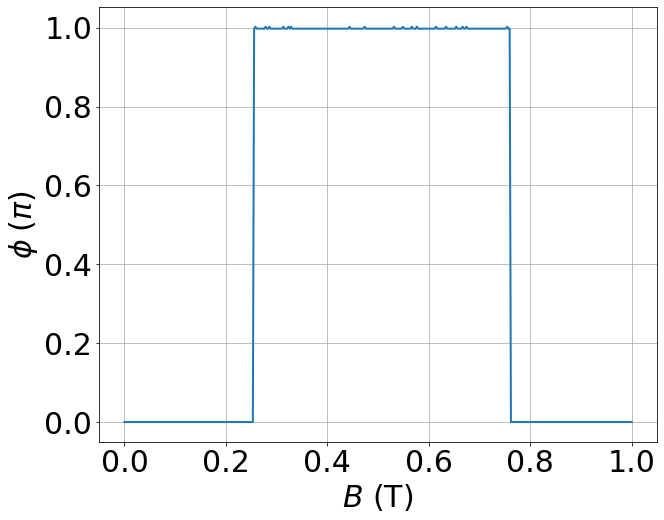

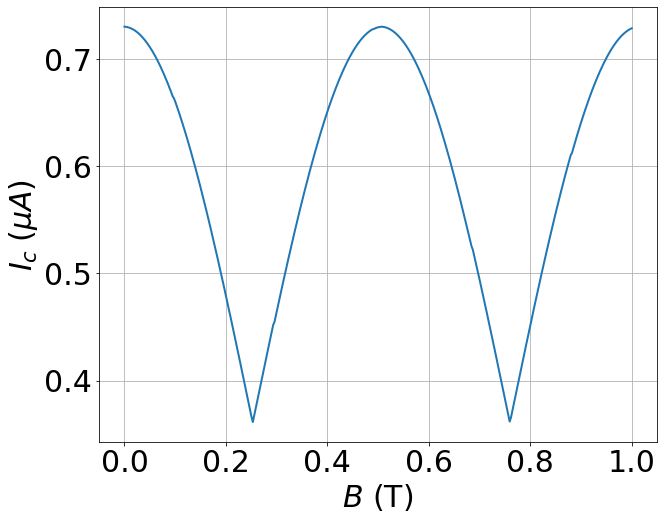

In [57]:

plt.figure(figsize=(10, 8))
plt.plot(B_values, data_ana_L_500, linewidth=2)
plt.ylabel("$\phi\; (\pi)$", fontsize=30)
plt.xlabel("$B$ (T)", fontsize=30)
plt.tick_params(labelsize=30)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 8))
plt.plot(B_values, np.array(Ic_values_L_500)*1e6, linewidth=2)
plt.ylabel("$I_c\;(\mu A)$", fontsize=30)
plt.xlabel("$B$ (T)", fontsize=30)
plt.tick_params(labelsize=30)
plt.grid(True)
plt.show()

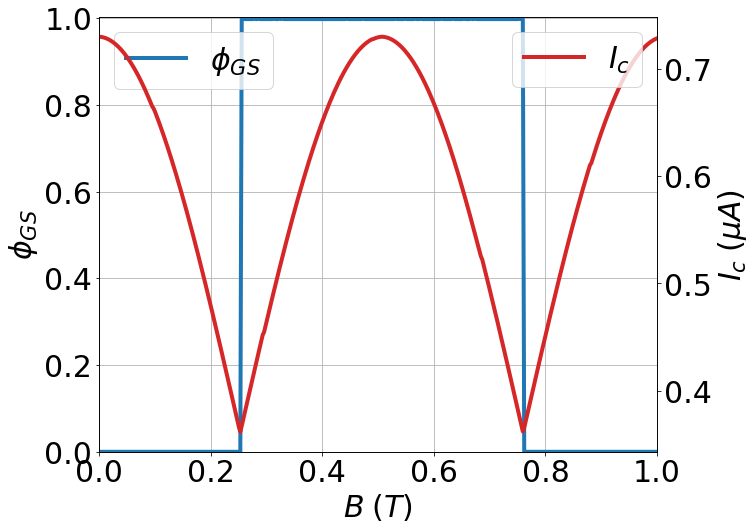

In [58]:
fig, ax1 = plt.subplots(figsize=(10, 8))

color = 'tab:blue'
ax1.set_xlabel('$B\;(T)$', fontsize = 30)
ax1.set_ylabel('$\phi_{GS}$', fontsize = 30)
ax1.plot(B_values, data_ana_L_500, color=color, linewidth=4.0, linestyle='-',\
         label = "$\phi_{GS}$")
ax1.tick_params(axis='y', labelsize=30)
ax1.tick_params(axis='x', labelsize=30)
ax1.set_xlim(0, np.amax(B_values))
ax1.set_ylim(0, np.max(data_ana_L_500))
ax1.grid()


ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel("$I_c\;(\mu A$)", fontsize = 30)
ax2.plot(B_values, np.array(Ic_values_L_500)*1e6, color=color, linewidth=4.0, \
         linestyle='-', label = "$I_c$")
ax2.tick_params(axis='y', labelsize=30)

ax1.legend(loc='upper left', fontsize=30)
ax2.legend(loc='upper right', fontsize=30)
#plt.savefig("ground_state_critical_current_B_ana_L_500.pdf")
plt.show()

In [59]:
miu = 5e-3
Delta = 0.2e-3
N = 15
L = 100  

phi_values = np.linspace(0, 2 * np.pi, 400)
B_values = np.linspace(0, 5, 400)
phi_min_L_100 = []
Ic_values_L_100=[]
for B_plane in B_values:
    negative_energies_sum_L_100 = []
    positive_energy_sum_L_100 = []
    for phi in phi_values:
        En_spin_p = -En_analytical_spin(phi, L, B_plane, miu, Delta, spin=1, N=N)
        En_spin_m = -En_analytical_spin(phi, L, B_plane, miu, Delta, spin=-1, N=N)
        total_negative_energy = En_spin_p + En_spin_m
        total_positive_energy = -(En_spin_p + En_spin_m)
        negative_energies_sum_L_100.append(total_negative_energy)
        positive_energy_sum_L_100.append(total_positive_energy)
        e_L_100 = np.array( positive_energy_sum_L_100)*sc.eV
    Is_L_100 = -(sc.e/sc.hbar) * np.gradient(e_L_100, phi_values)
    Ic_L_100 = np.amax(Is_L_100)
    Ic_values_L_100.append(Ic_L_100)
    min_index_L_100 = np.argmin(negative_energies_sum_L_100)
    phi_min_L_100.append(phi_values[min_index_L_100])

phi_min_L_100 = np.array(phi_min_L_100)

In [60]:
data_ana_L_100 = phi_min_L_100/np.pi
data_ana_L_100[data_ana_L_100 == 2] = 0

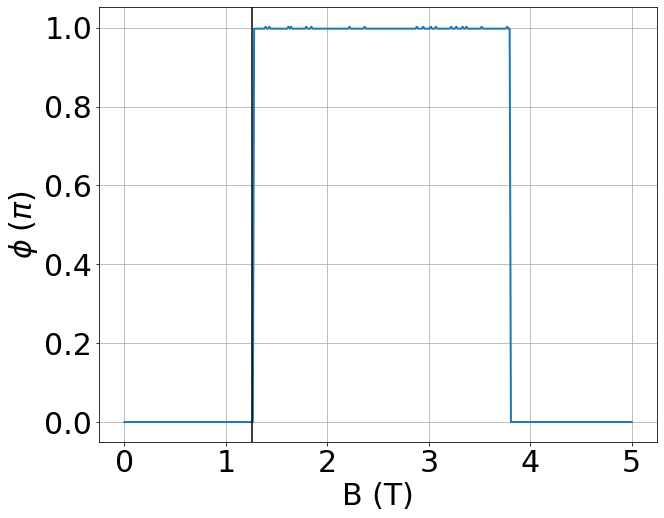

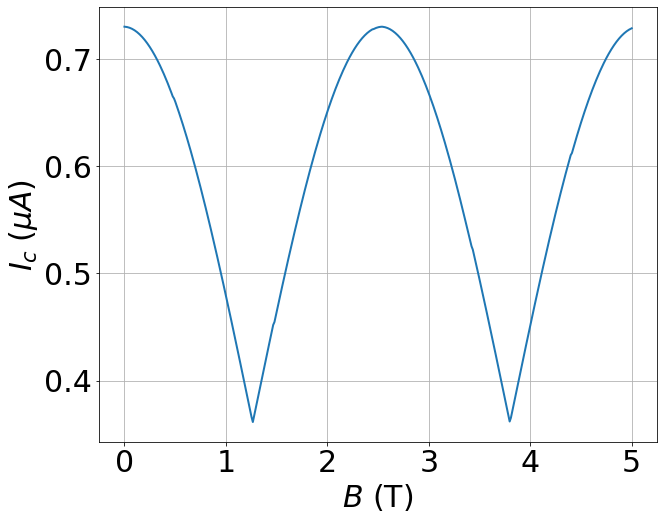

In [61]:
plt.figure(figsize=(10, 8))
plt.plot(B_values, data_ana_L_100, linewidth=2)
plt.ylabel("$\phi\; (\pi)$", fontsize=30)
plt.axvline(x= 1.26, c= 'k')
plt.xlabel('B (T)', fontsize=30)
plt.tick_params(labelsize=30)
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 8))
plt.plot(B_values, np.array(Ic_values_L_100)*1e6, linewidth=2)
plt.ylabel("$I_c\;(\mu A)$", fontsize=30)
plt.xlabel("$B$ (T)", fontsize=30)
plt.tick_params(labelsize=30)
#plt.axvline(x= 3.8, c= 'k')
plt.grid(True)
plt.show()

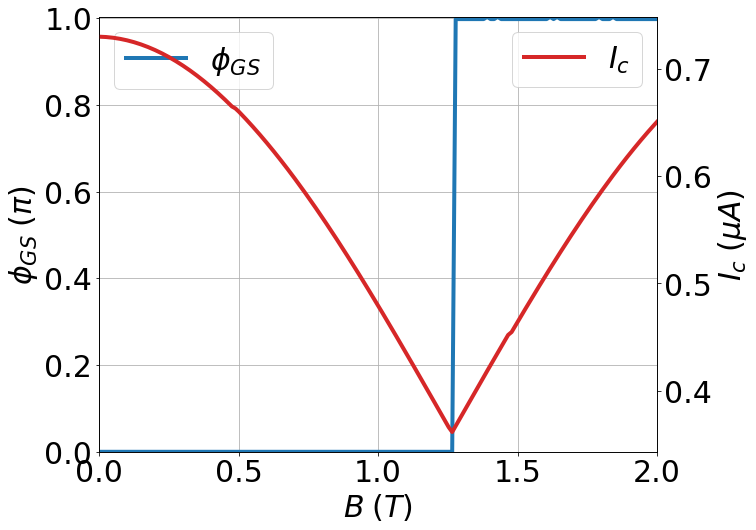

In [62]:

B_values = np.linspace(0, 5, 400)

fig, ax1 = plt.subplots(figsize=(10, 8))

color = 'tab:blue'
ax1.set_xlabel('$B\;(T)$', fontsize = 30)
ax1.set_ylabel('$\phi_{GS}\; (\pi)$', fontsize = 30)
ax1.plot(B_values, data_ana_L_100, color=color, linewidth=4.0, linestyle='-',\
         label = "$\phi_{GS}$")
ax1.tick_params(axis='y', labelsize=30)
ax1.tick_params(axis='x', labelsize=30)
ax1.set_xlim(0, 2)
ax1.set_ylim(0, np.max(data_ana_L_100))
ax1.grid()


ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel("$I_c\;(\mu A$)", fontsize = 30)
ax2.plot(B_values, np.array(Ic_values_L_100)*1e6, color=color, linewidth=4.0, \
         linestyle='-', label = "$I_c$")
ax2.tick_params(axis='y', labelsize=30)

ax1.legend(loc='upper left', fontsize=30)
ax2.legend(loc='upper right', fontsize=30)
#plt.savefig("ground_state_critical_current_B_ana_L_100.pdf")
plt.show()

/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


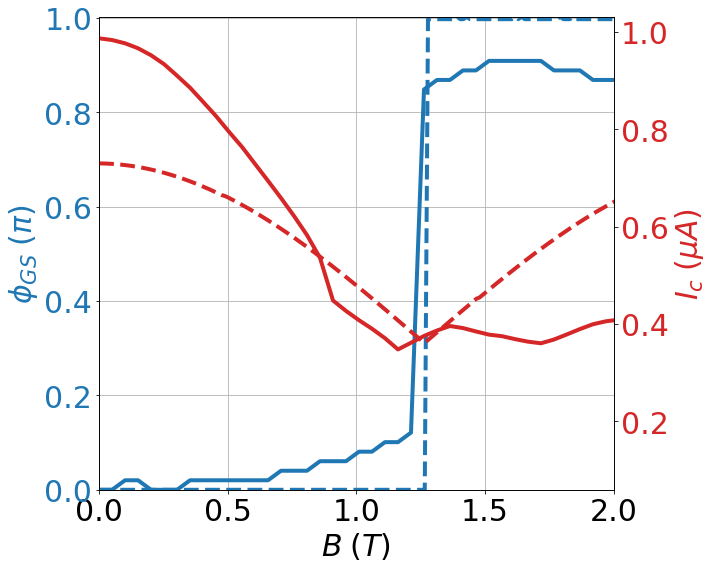

In [63]:
B_values_numeric = np.linspace(0, 5, 100)
B_values_analytical = np.linspace(0, 5, 400)

fig, ax1 = plt.subplots(figsize=(10, 8))

color = 'tab:blue'
ax1.set_xlabel('$B\;(T)$', fontsize=30)
ax1.set_ylabel('$\phi_{GS}\; (\pi)$', fontsize=30, color=color)
ax1.plot(B_values_numeric, data_L_100, color=color, linewidth=4.0, linestyle='-', label="$\phi_{GS}$ (num)")
ax1.tick_params(axis='y', labelsize=30, labelcolor=color)
ax1.tick_params(axis='x', labelsize=30)
ax1.set_xlim(0, 2)
ax1.set_ylim(0, np.max(data_ana_L_100))
ax1.grid()

ax1_twin = ax1.twinx()
color = 'tab:red'
ax1_twin.set_ylabel("$I_c\;(\mu A)$", fontsize=30, color=color)
ax1_twin.plot(B_values_numeric, np.array(Pickle_I_c_values_L_N_100) * 1e6, color=color, linewidth=4.0, linestyle='-', label="$I_c$ (num)")
ax1_twin.tick_params(axis='y', labelsize=30, labelcolor=color)

color = 'tab:blue'
ax1.plot(B_values_analytical, data_ana_L_100, color=color, linewidth=4.0, linestyle='--', label="$\phi_{GS}$ (ana)")
color = 'tab:red'
ax1_twin.plot(B_values_analytical, np.array(Ic_values_L_100) * 1e6, color=color, linewidth=4.0, linestyle='--', label="$I_c$ (ana)")

plt.tight_layout()
#plt.savefig("combined_numeric_analytical_plot_L_100.pdf", bbox_inches='tight')
plt.show()



/opt/conda/miniconda3/envs/python3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1333: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


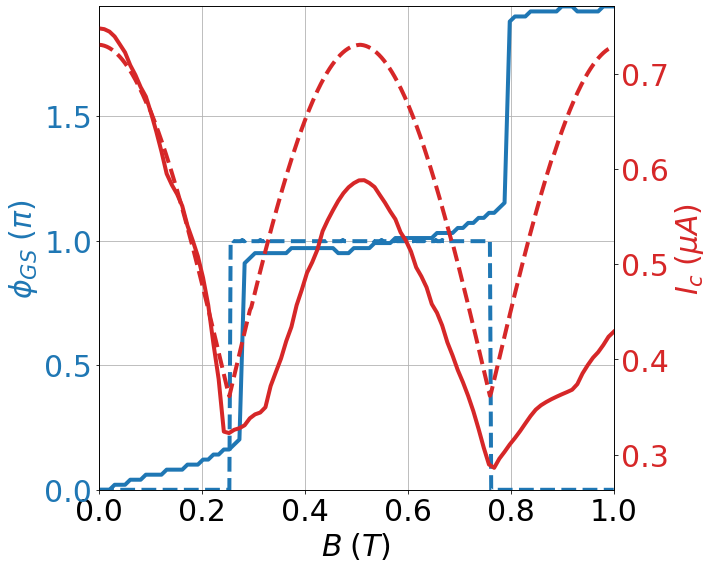

In [64]:
B_values_numeric = np.linspace(0, 1, 100)
B_values_analytical = np.linspace(0, 1, 400)

fig, ax1 = plt.subplots(figsize=(10, 8))

color = 'tab:blue'
ax1.set_xlabel('$B\;(T)$', fontsize=30)
ax1.set_ylabel('$\phi_{GS}\; (\pi)$', fontsize=30, color=color)
ax1.plot(B_values_numeric, data_L_500, color=color, linewidth=4.0, linestyle='-', label="$\phi_{GS}$ (num)")
ax1.tick_params(axis='y', labelsize=30, labelcolor=color)
ax1.tick_params(axis='x', labelsize=30)
ax1.set_xlim(0, np.max(B_values_numeric))
ax1.set_ylim(0, np.max(data_L_500))
ax1.set_yticks(np.arange(0, 2, 0.5))
ax1.grid()
ax1_twin = ax1.twinx()
color = 'tab:red'
ax1_twin.set_ylabel("$I_c\;(\mu A)$", fontsize=30, color=color)
ax1_twin.plot(B_values_numeric, np.array(Pickle_I_c_values_L_N_500) * 1e6, color=color, linewidth=4.0, linestyle='-', label="$I_c$ (num)")
ax1_twin.tick_params(axis='y', labelsize=30, labelcolor=color)

color = 'tab:blue'
ax1.plot(B_values_analytical, data_ana_L_500, color=color, linewidth=4.0, linestyle='--', label="$\phi_{GS}$ (ana)")
color = 'tab:red'
ax1_twin.plot(B_values_analytical, np.array(Ic_values_L_500) * 1e6, color=color, linewidth=4.0, linestyle='--', label="$I_c$ (ana)")
plt.tight_layout()
#plt.savefig("combined_numeric_analytical_plot_L_500.pdf", bbox_inches='tight')
plt.show()
